In [1]:
import imblearn
import pandas as pd
import numpy as np  
import matplotlib.pyplot as plt
import seaborn as sns
import time

from sklearn.feature_selection import mutual_info_classif
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, KFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import roc_auc_score, f1_score, confusion_matrix, accuracy_score, classification_report
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn import tree


from scipy.stats import ks_2samp, mannwhitneyu

In [2]:
df = pd.read_csv("contributors2.csv")
df
selected_columns = ['name_with_owner','is_core', 'issues', 'prs', 'pr_comments_self', 'pr_comments_others', 
                    'issues_comments_self', 'issues_comments_others', 'pr_reactions_self', 'pr_reactions_others', 
                    'issues_reactions_self', 'issues_reactions_others', 'issue_hours_to_respond_reaction', 
                    'pr_hours_to_respond_reaction', 'issue_hours_to_respond_comment', 'pr_hours_to_respond_comment',
                    'days_to_close_issue', 'days_to_close_pr']

pred_cols = ['issues', 'prs', 'pr_comments_self', 'pr_comments_others', 
                    'issues_comments_self', 'issues_comments_others', 'pr_reactions_self', 'pr_reactions_others', 
                    'issues_reactions_self', 'issues_reactions_others', 'issue_hours_to_respond_reaction', 
                    'pr_hours_to_respond_reaction', 'issue_hours_to_respond_comment', 'pr_hours_to_respond_comment',
                    'days_to_close_issue', 'days_to_close_pr']

# Subset the DataFrame based on the selected columns
c3 = df[selected_columns].copy()
c3 = c3.drop(columns = 'name_with_owner')




'''# Subset the DataFrame based on the selected columns
c3 = df[selected_columns].copy()
#get projects not in cluster
c3_cols = ['umijs/umi', 'netbox-community/netbox', 'grafana/loki', 'awsdocs/aws-doc-sdk-examples', 'vueuse/vueuse',
     'yuzu-emu/yuzu', 'TanStack/query', 'lvgl/lvgl', 'arendst/Tasmota', 'Aircoookie/WLED']
#combine into one list
c3 = c3[c3['name_with_owner'].isin(c3_cols)]
c3 = c3.drop(columns = 'name_with_owner')'''

"# Subset the DataFrame based on the selected columns\nc3 = df[selected_columns].copy()\n#get projects not in cluster\nc3_cols = ['umijs/umi', 'netbox-community/netbox', 'grafana/loki', 'awsdocs/aws-doc-sdk-examples', 'vueuse/vueuse',\n     'yuzu-emu/yuzu', 'TanStack/query', 'lvgl/lvgl', 'arendst/Tasmota', 'Aircoookie/WLED']\n#combine into one list\nc3 = c3[c3['name_with_owner'].isin(c3_cols)]\nc3 = c3.drop(columns = 'name_with_owner')"

In [3]:
df.columns

Index(['name_with_owner', 'login', 'url', 'type', 'admin', 'contributions',
       'commits', 'core_qty', 'core_time', 'is_core', 'issues', 'prs',
       'pr_comments_self', 'pr_comments_others', 'issues_comments_self',
       'issues_comments_others', 'pr_reactions_self', 'pr_reactions_others',
       'issues_reactions_self', 'issues_reactions_others',
       'issue_hours_to_respond_reaction', 'pr_hours_to_respond_reaction',
       'issue_hours_to_respond_comment', 'pr_hours_to_respond_comment',
       'days_to_close_issue', 'days_to_close_pr', 'login-2', 'bio', 'repos',
       'gists', 'followers', 'following', 'created', 'months_experience',
       'has_bio'],
      dtype='object')

In [4]:
c3

,is_core,issues,prs,pr_comments_self,pr_comments_others,issues_comments_self,issues_comments_others,pr_reactions_self,pr_reactions_others,issues_reactions_self,issues_reactions_others,issue_hours_to_respond_reaction,pr_hours_to_respond_reaction,issue_hours_to_respond_comment,pr_hours_to_respond_comment,days_to_close_issue,days_to_close_pr
0,0,0,1,3,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,0.000,0.189
1,0,1,2,3,1,2,0,0,1,0,0,0.000,0.242,0.000,20.260,0.447,0.472
2,0,0,5,17,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,0.000,11.146
3,0,0,3,4,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,0.000,0.093
4,0,3,4,9,2,1,0,2,0,2,5,4099.324,0.000,0.000,80.227,85.057,99.375
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8439,0,1,1,1,0,2,0,0,0,0,0,0.000,0.000,0.000,0.000,0.012,31.954
8440,0,21,1,0,0,60,0,0,0,1,0,0.000,0.000,0.000,0.000,40.585,0.176
8441,0,0,1,1,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,0.000,0.036
8442,0,0,1,2,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,0.000,5.038


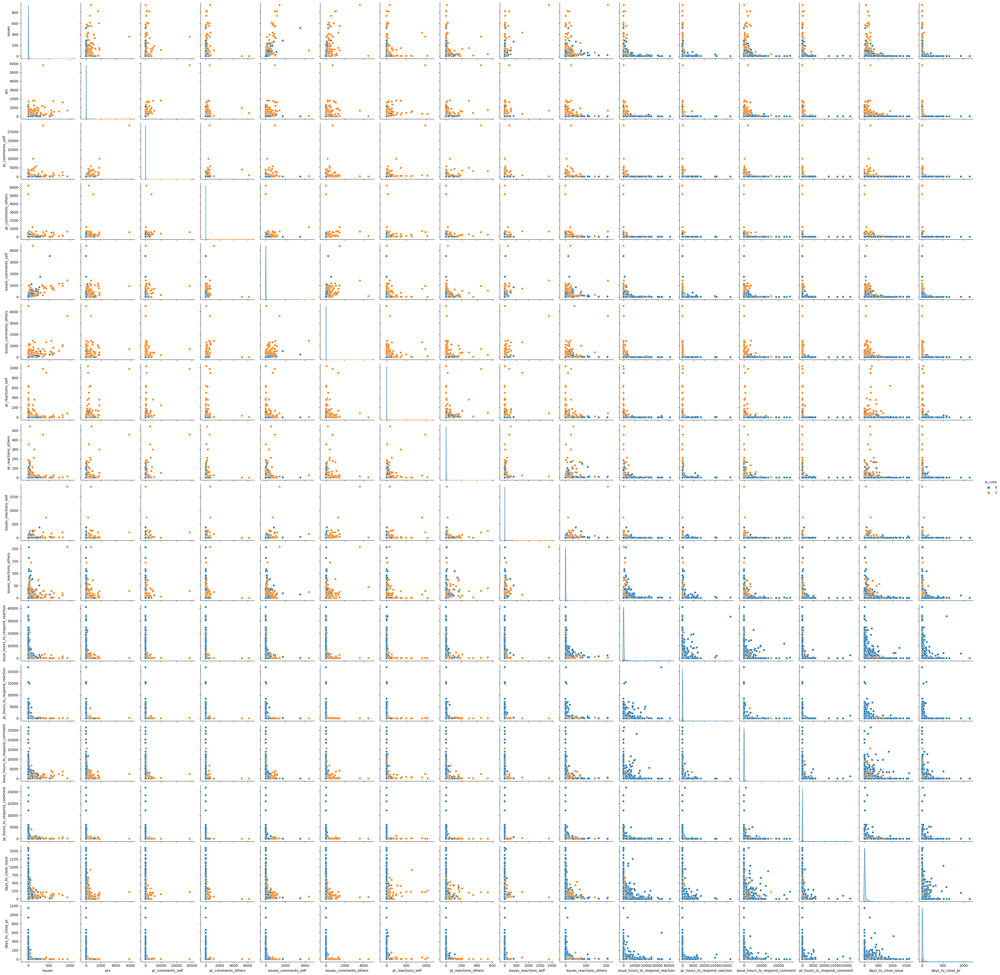

In [5]:
sns.pairplot(c3, hue = 'is_core')

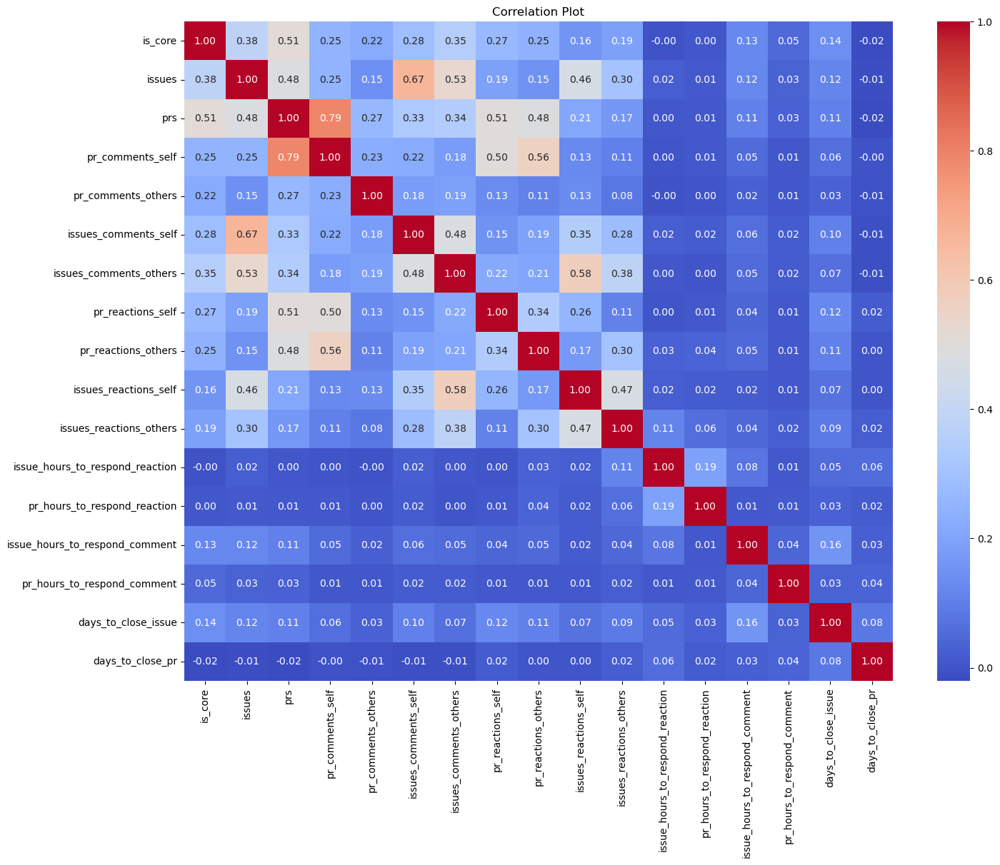

In [6]:
# Creating a correlation heatmap
plt.figure(figsize=(16, 12))
sns.heatmap(c3.corr(), annot=True, cmap='coolwarm', fmt=".2f")

# Adding a title
plt.title('Correlation Plot')

# Displaying the plot
plt.show() 

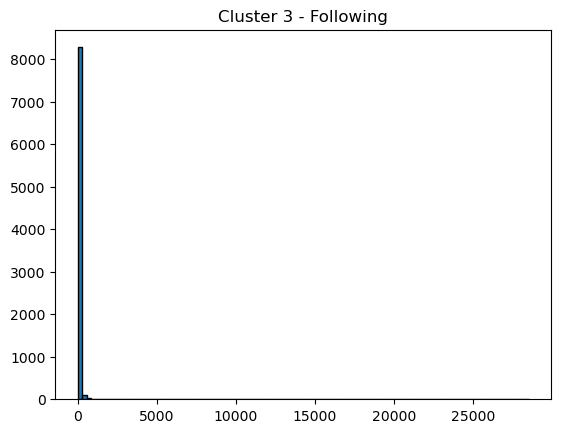

In [7]:
plt.hist(c3.pr_comments_self, bins=100, edgecolor='black')
plt.title('Cluster 3 - Following')
plt.show()

In [8]:
x = c3.drop(columns='is_core')
y = c3['is_core']
x = x.to_numpy()
y = y.to_numpy()

In [9]:
adasyn = imblearn.over_sampling.ADASYN(random_state = 0)
# Fit and transform the data
x_resampled_adasyn, y_resampled_adasyn = adasyn.fit_resample(x,y)
df_resampled_adasyn = pd.DataFrame(data=x_resampled_adasyn, columns=pred_cols)  # Replace column names as needed
df_resampled_adasyn['is_core'] = y_resampled_adasyn  # Assuming 'target' is the name of your target column
df_resampled_adasyn

,issues,prs,pr_comments_self,pr_comments_others,issues_comments_self,issues_comments_others,pr_reactions_self,pr_reactions_others,issues_reactions_self,issues_reactions_others,issue_hours_to_respond_reaction,pr_hours_to_respond_reaction,issue_hours_to_respond_comment,pr_hours_to_respond_comment,days_to_close_issue,days_to_close_pr,is_core
0,0.000000,1.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.189000,0
1,1.000000,2.000000,3.000000,1.000000,2.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.242000,0.000000,20.260000,0.447000,0.472000,0
2,0.000000,5.000000,17.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,11.146000,0
3,0.000000,3.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.093000,0
4,3.000000,4.000000,9.000000,2.000000,1.000000,0.000000,2.000000,0.000000,2.000000,5.000000,4099.324000,0.000000,0.000000,80.227000,85.057000,99.375000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16190,26.731514,89.170173,17.171006,25.756301,20.073110,44.512185,0.975630,2.926890,5.414705,1.463445,5.004982,0.525865,276.077090,104.906288,108.994113,8.253834,1
16191,20.674466,71.636612,25.778390,32.132141,18.160358,44.193393,1.613214,4.839642,7.646249,2.419821,8.275788,0.869522,311.786896,130.014985,134.722222,5.327960,1
16192,15.792311,59.721271,32.278729,34.010866,15.792311,40.945258,1.857919,5.573757,8.360635,2.786878,9.531124,1.001418,329.423992,147.206795,139.650480,4.398879,1
16193,25.316854,78.913224,27.161452,16.167502,6.124114,18.409680,3.919274,2.161452,3.242178,1.080726,3.696083,0.388341,301.441627,115.657552,59.170242,3.483266,1


In [10]:
smnc = imblearn.over_sampling.SMOTE(random_state=0)
x_resampled_smnc, y_resampled_smnc = smnc.fit_resample(x, y)
df_resampled_smnc = pd.DataFrame(data=x_resampled_smnc, columns=pred_cols)
df_resampled_smnc['is_core'] = y_resampled_smnc
df_resampled_smnc

,issues,prs,pr_comments_self,pr_comments_others,issues_comments_self,issues_comments_others,pr_reactions_self,pr_reactions_others,issues_reactions_self,issues_reactions_others,issue_hours_to_respond_reaction,pr_hours_to_respond_reaction,issue_hours_to_respond_comment,pr_hours_to_respond_comment,days_to_close_issue,days_to_close_pr,is_core
0,0.000000,1.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.189000,0
1,1.000000,2.000000,3.000000,1.000000,2.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.242000,0.000000,20.260000,0.447000,0.472000,0
2,0.000000,5.000000,17.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,11.146000,0
3,0.000000,3.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.093000,0
4,3.000000,4.000000,9.000000,2.000000,1.000000,0.000000,2.000000,0.000000,2.000000,5.000000,4099.324000,0.000000,0.000000,80.227000,85.057000,99.375000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16165,29.564827,21.420102,4.130651,119.693485,528.211108,109.751774,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,92.597663,69.600001,47.351784,0.229838,1
16166,21.680849,165.659557,577.255323,23.595754,59.425539,63.553181,5.765957,3.000000,0.382978,0.617022,40.735145,46.765897,294.716437,52.822330,142.630045,14.970827,1
16167,0.000000,82.125307,128.984643,24.859337,0.000000,9.578010,0.421990,2.578010,0.000000,0.859337,0.038670,17.010569,44.325144,167.541376,0.000000,32.938980,1
16168,2.206444,108.367741,63.483891,11.425816,11.399959,78.199877,2.206444,1.103222,0.000000,1.470962,6.524822,16.488018,46.813779,42.785554,1.633136,0.819214,1


In [11]:
border = imblearn.over_sampling.BorderlineSMOTE(random_state=0)
x_resampled_border, y_resampled_border = border.fit_resample(x, y)
df_resampled_border = pd.DataFrame(data=x_resampled_border, columns=pred_cols)
df_resampled_border['is_core'] = y_resampled_border
df_resampled_border

,issues,prs,pr_comments_self,pr_comments_others,issues_comments_self,issues_comments_others,pr_reactions_self,pr_reactions_others,issues_reactions_self,issues_reactions_others,issue_hours_to_respond_reaction,pr_hours_to_respond_reaction,issue_hours_to_respond_comment,pr_hours_to_respond_comment,days_to_close_issue,days_to_close_pr,is_core
0,0.000000,1.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.189000,0
1,1.000000,2.000000,3.000000,1.000000,2.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.242000,0.000000,20.260000,0.447000,0.472000,0
2,0.000000,5.000000,17.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,11.146000,0
3,0.000000,3.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.093000,0
4,3.000000,4.000000,9.000000,2.000000,1.000000,0.000000,2.000000,0.000000,2.000000,5.000000,4099.324000,0.000000,0.000000,80.227000,85.057000,99.375000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16165,1.676869,144.056181,26.619141,0.161565,0.838435,2.515304,0.838435,0.000000,0.000000,0.000000,0.000000,0.000000,3.650545,0.054932,9.273088,13.673782,1
16166,128.395300,263.738469,366.377982,40.494257,76.459269,27.406962,4.825588,4.238381,1.000000,0.470931,0.498716,24.797356,1347.681878,228.570472,43.708515,5.329747,1
16167,33.003480,107.325863,8.258212,19.154231,22.053731,44.842288,0.315423,0.946269,3.103981,0.473135,1.618121,0.170013,239.100220,78.906679,82.353113,11.283523,1
16168,15.758748,134.859153,10.873923,1.000000,17.382099,12.994549,3.539300,0.000000,2.654475,0.000000,0.000000,0.000000,972.384111,0.484967,164.081070,1.039999,1


In [12]:
print(c3['is_core'].value_counts())
print(df_resampled_adasyn['is_core'].value_counts())

0    8085
1     359
Name: is_core, dtype: int64
1    8110
0    8085
Name: is_core, dtype: int64


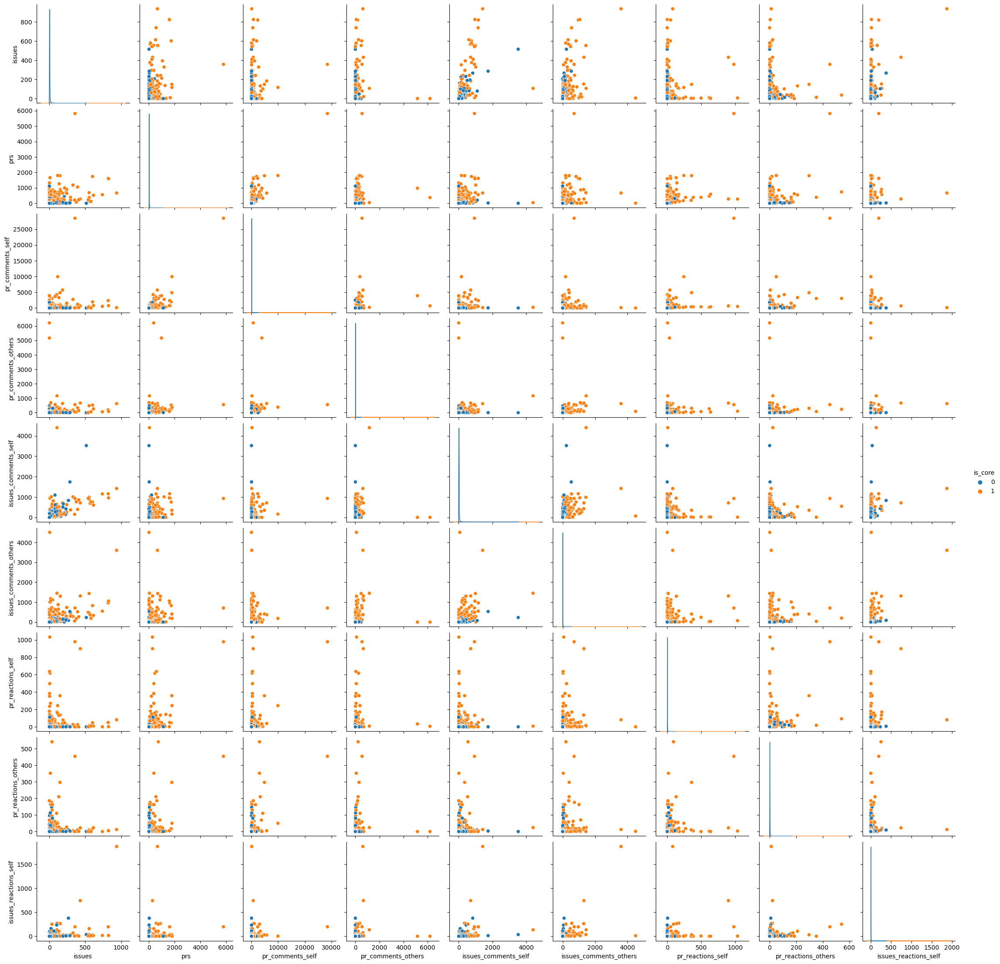

In [13]:
sns.pairplot(c3.iloc[:,:10], hue = 'is_core')

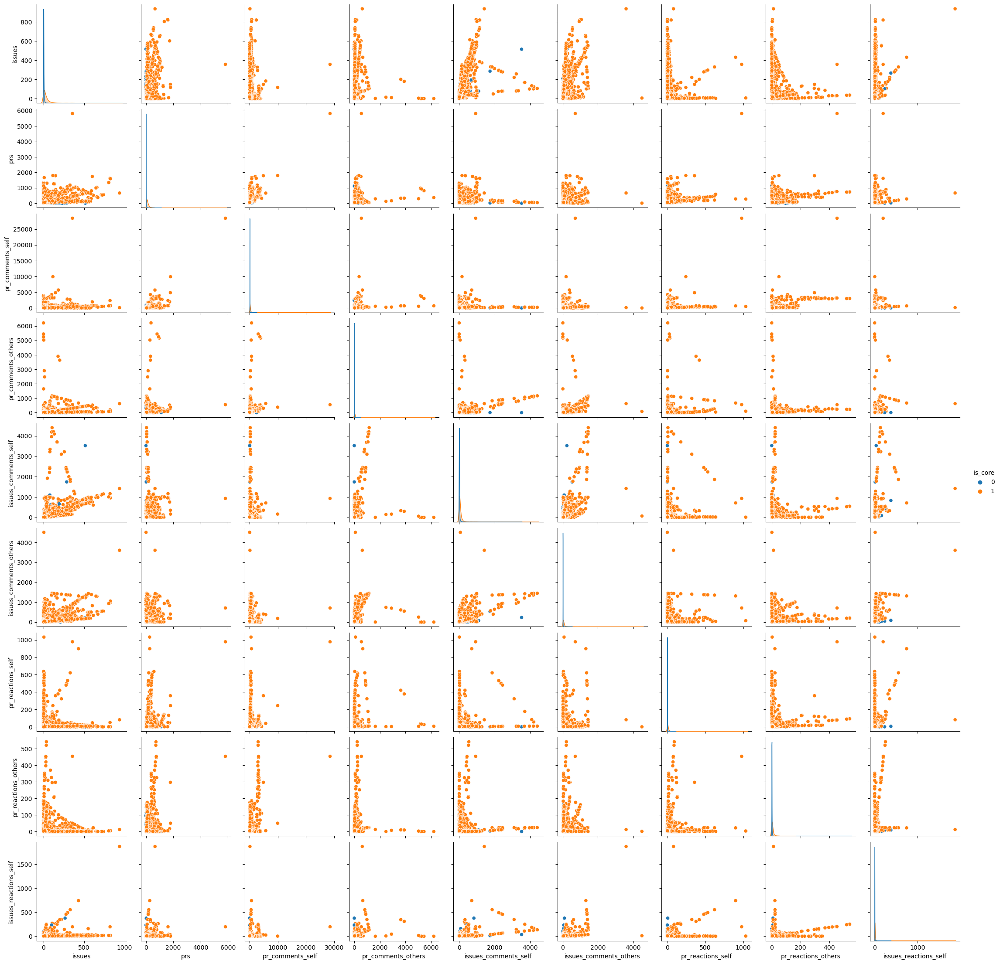

In [14]:
# Specify the subset of columns including 'is_core'
columns_subset = df_resampled_adasyn.columns[:9].tolist() + ['is_core']
columns_subset
# Create pairplot with 'is_core' as hue
sns.pairplot(df_resampled_adasyn[columns_subset], hue='is_core')

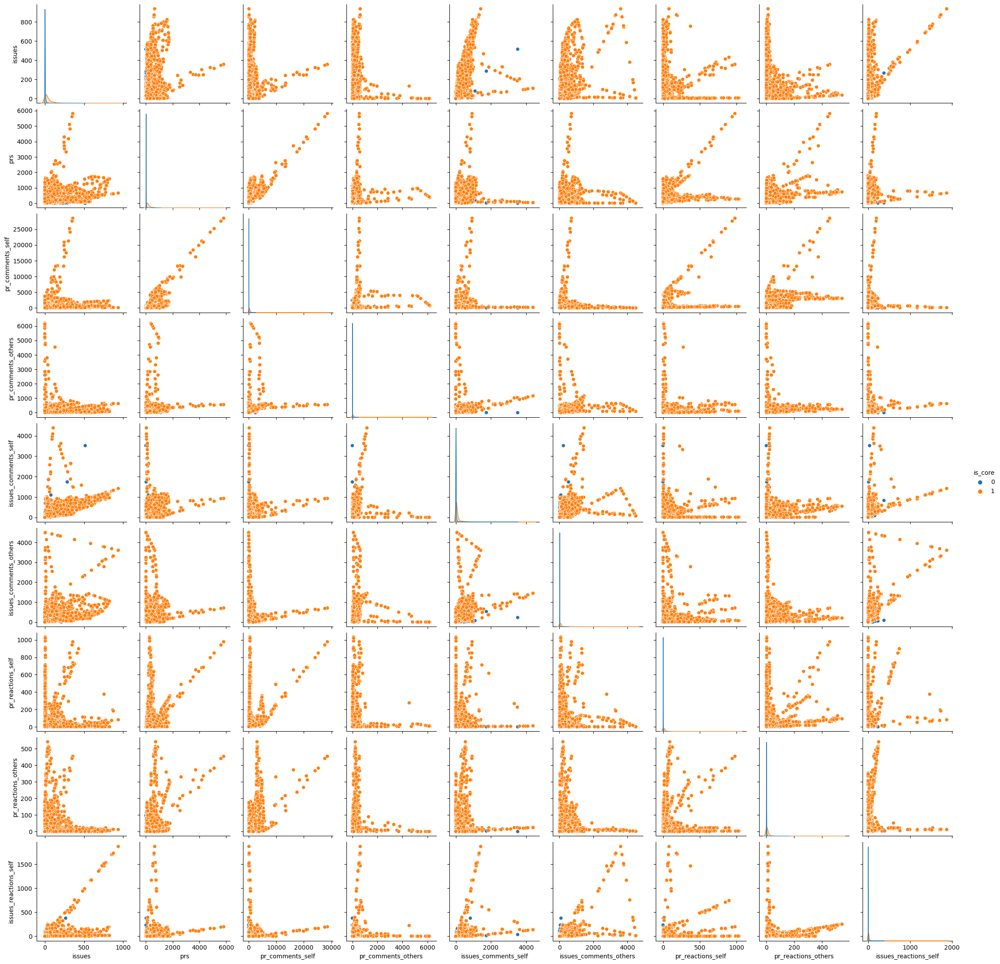

In [15]:
# Specify the subset of columns including 'is_core'
columns_subset = df_resampled_smnc.columns[:9].tolist() + ['is_core']
columns_subset
# Create pairplot with 'is_core' as hue
sns.pairplot(df_resampled_smnc[columns_subset], hue='is_core')

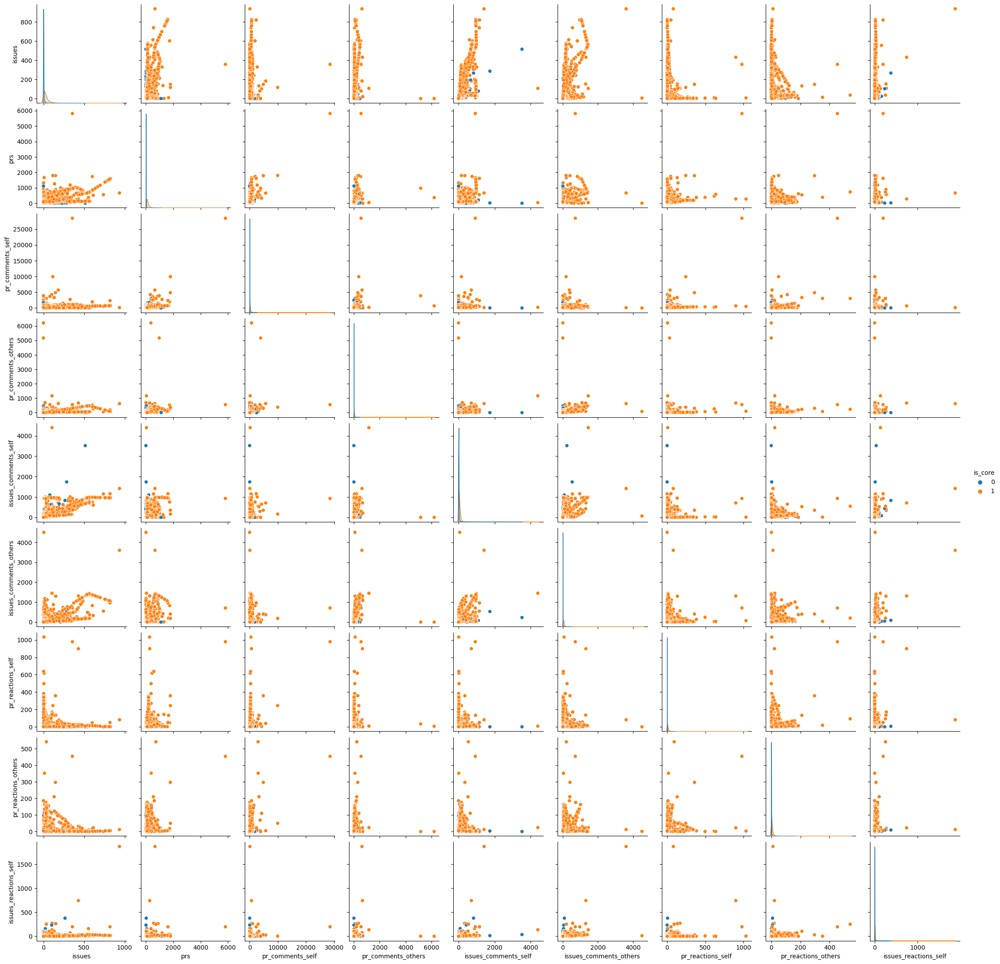

In [16]:
# Specify the subset of columns including 'is_core'
columns_subset = df_resampled_border.columns[:9].tolist() + ['is_core']
columns_subset
# Create pairplot with 'is_core' as hue
sns.pairplot(df_resampled_border[columns_subset], hue='is_core')

In [17]:
df_resampled_adasyn.columns

Index(['issues', 'prs', 'pr_comments_self', 'pr_comments_others',
       'issues_comments_self', 'issues_comments_others', 'pr_reactions_self',
       'pr_reactions_others', 'issues_reactions_self',
       'issues_reactions_others', 'issue_hours_to_respond_reaction',
       'pr_hours_to_respond_reaction', 'issue_hours_to_respond_comment',
       'pr_hours_to_respond_comment', 'days_to_close_issue',
       'days_to_close_pr', 'is_core'],
      dtype='object')

In [18]:
df_resampled_adasyn['is_core'].unique()

array([0, 1], dtype=int64)

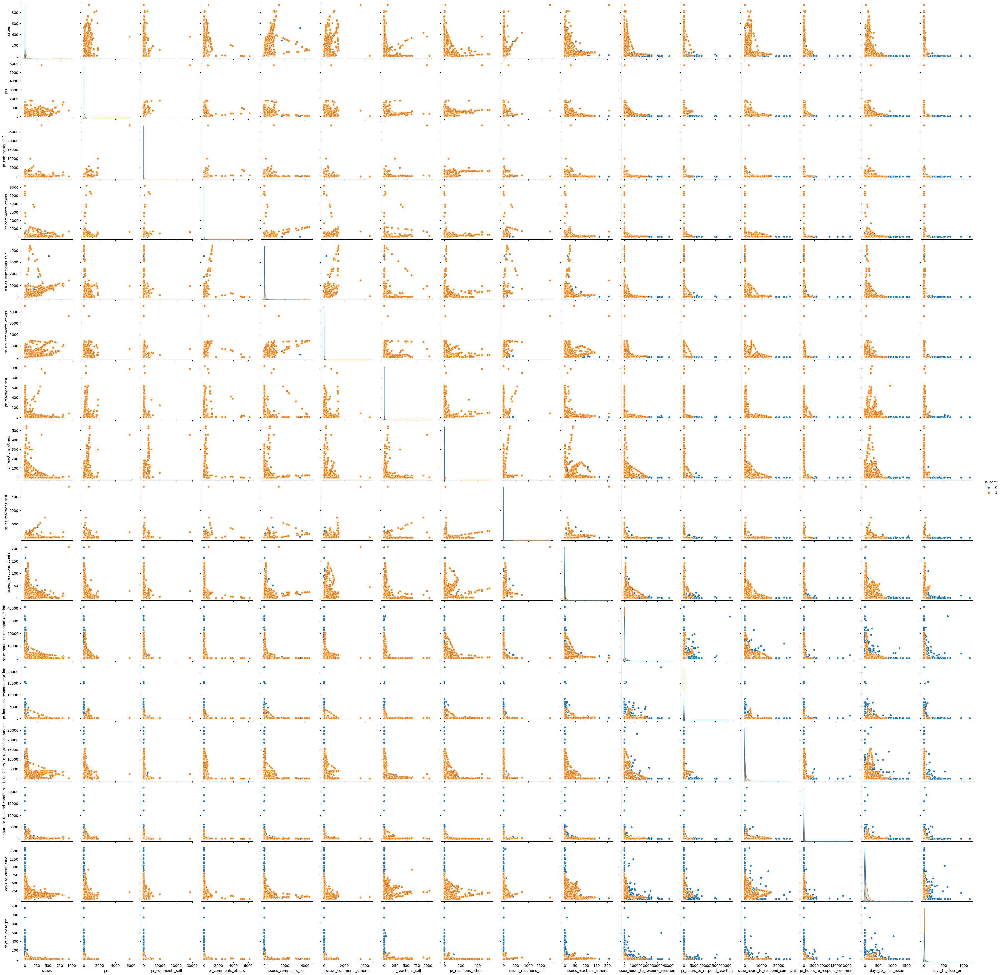

In [19]:
sns.pairplot(df_resampled_adasyn, hue = 'is_core')

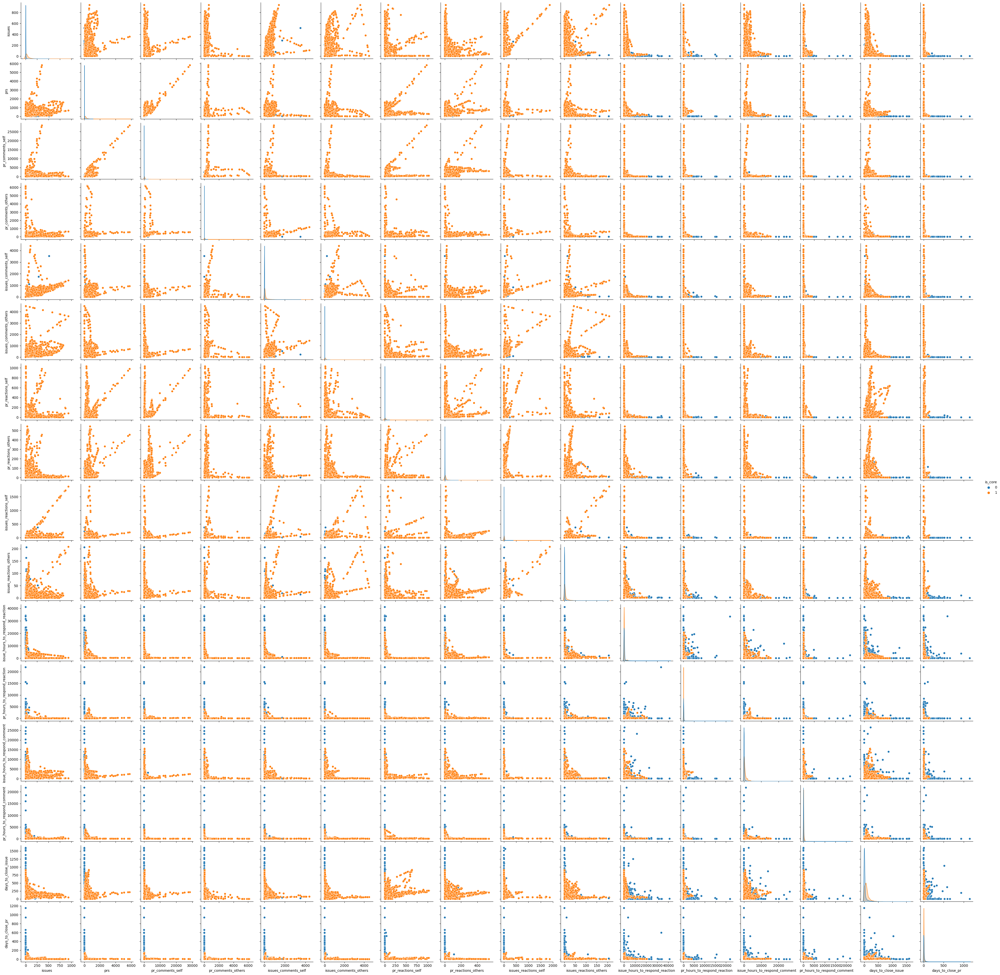

In [20]:
sns.pairplot(df_resampled_smnc, hue = 'is_core')

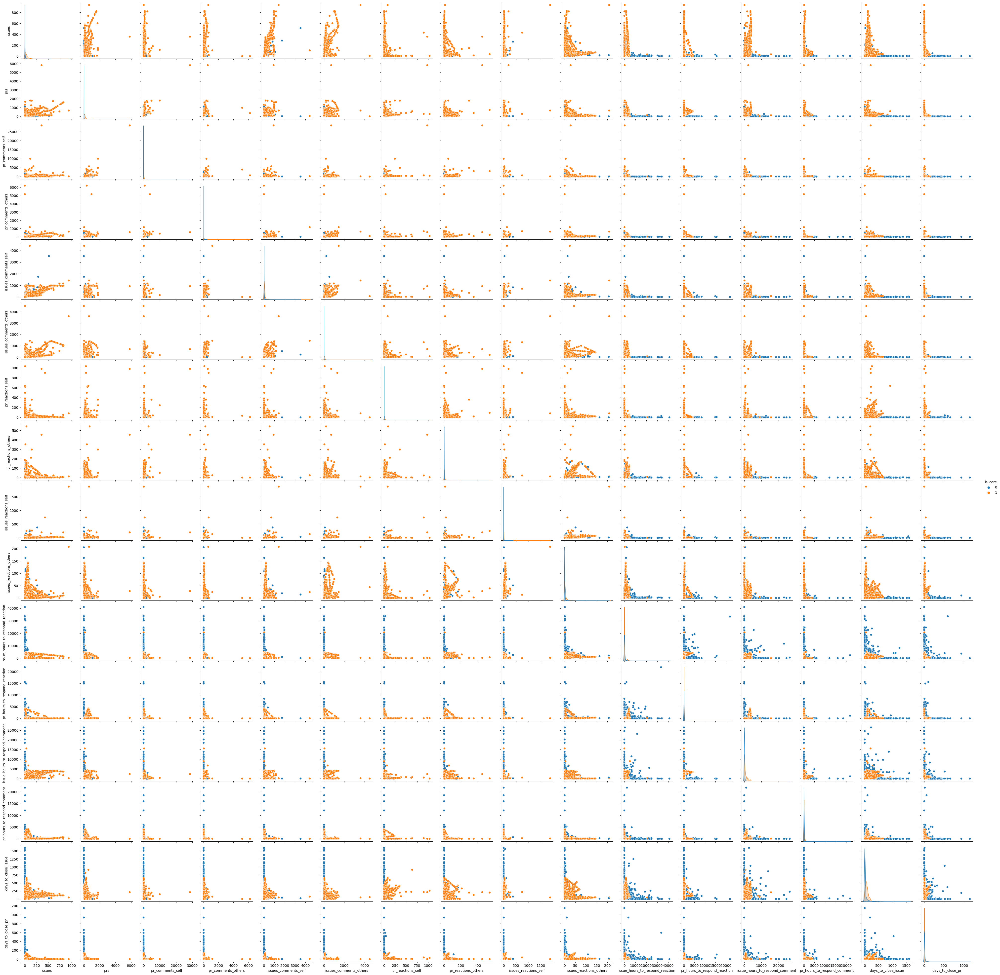

In [21]:
sns.pairplot(df_resampled_border, hue = 'is_core')

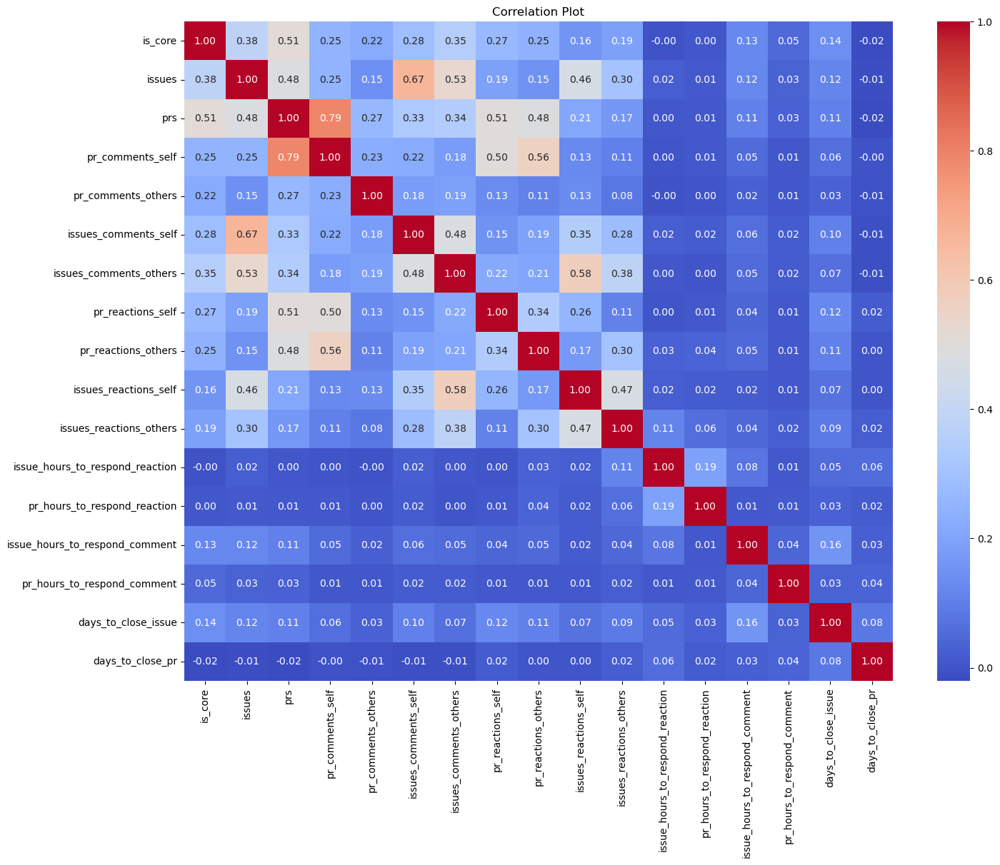

In [22]:
# Creating a correlation heatmap
plt.figure(figsize=(16, 12))
sns.heatmap(c3.corr(), annot=True, cmap='coolwarm', fmt=".2f")

# Adding a title
plt.title('Correlation Plot')

# Displaying the plot
plt.show()

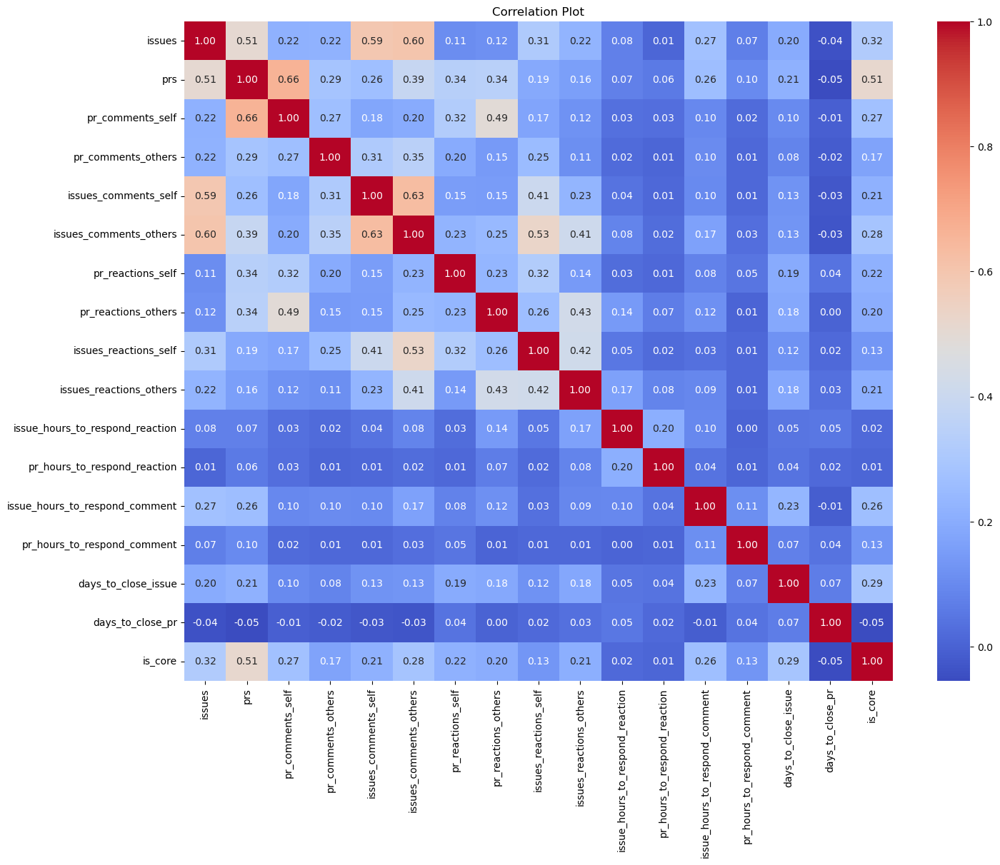

In [23]:
# Creating a correlation heatmap
plt.figure(figsize=(16, 12))
sns.heatmap(df_resampled_adasyn.corr(), annot=True, cmap='coolwarm', fmt=".2f")

# Adding a title
plt.title('Correlation Plot')

# Displaying the plot
plt.show()

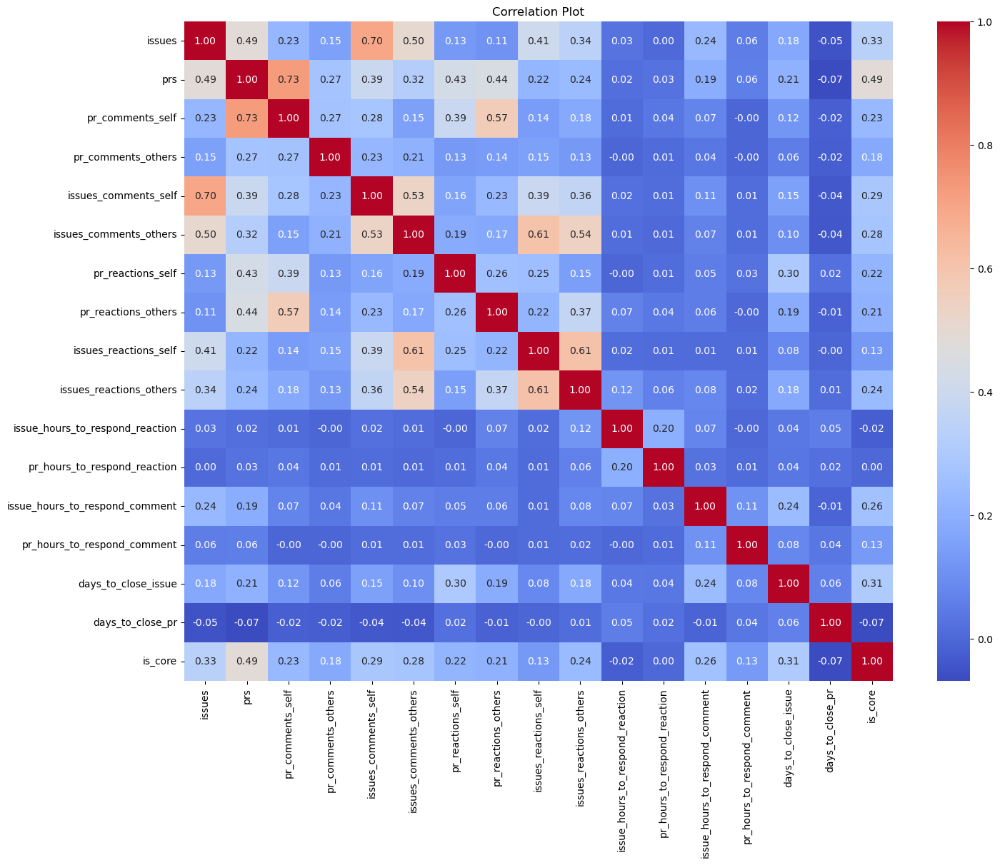

In [24]:
# Creating a correlation heatmap
plt.figure(figsize=(16, 12))
sns.heatmap(df_resampled_smnc.corr(), annot=True, cmap='coolwarm', fmt=".2f")

# Adding a title
plt.title('Correlation Plot')

# Displaying the plot
plt.show()

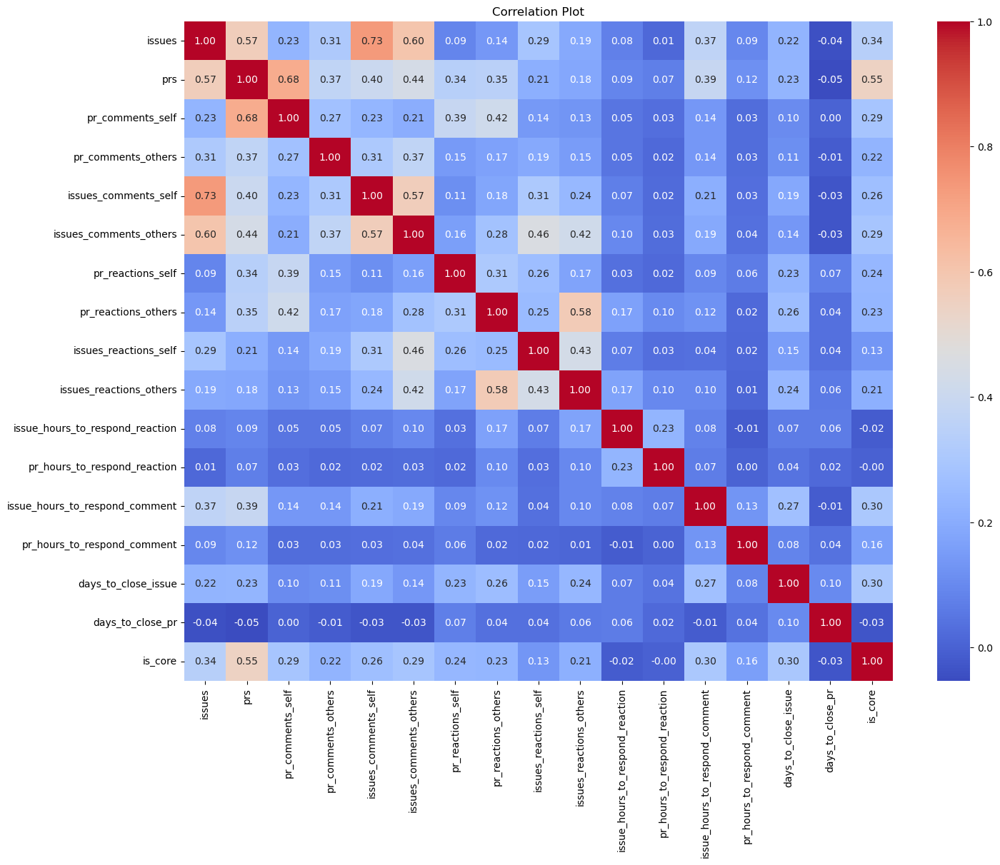

In [25]:
# Creating a correlation heatmap
plt.figure(figsize=(16, 12))
sns.heatmap(df_resampled_border.corr(), annot=True, cmap='coolwarm', fmt=".2f")

# Adding a title
plt.title('Correlation Plot')

# Displaying the plot
plt.show()

In [26]:
ks_adasyn = []
p_adasyn = []
ks_smnc = []
p_smnc =[]
ks_border = []
p_border = []
for i in range(15):
    x = c3.iloc[:, i+1]
    y1 = df_resampled_adasyn.iloc[:,i]
    y2 = df_resampled_smnc.iloc[:,i]
    y3 = df_resampled_border.iloc[:,i]
    
    ks_stat1, ks_pvalue1 = ks_2samp(x, y1)
    ks_stat2, ks_pvalue2 = ks_2samp(x, y2)
    ks_stat3, ks_pvalue3 = ks_2samp(x, y3)
    
    ks_adasyn.append(ks_stat1)
    ks_smnc.append(ks_stat2)
    ks_border.append(ks_stat3)
    
    p_adasyn.append(ks_pvalue1)
    p_smnc.append(ks_pvalue2)
    p_border.append(ks_pvalue3)

In [27]:
for i in range(len(p_adasyn)):
    print(p_border[i] < 0.05)

True
True
True
True
True
True
True
True
True
True
True
True
True
True
True


In [28]:
for i in range(len(p_smnc)):
    print(p_border[i] < 0.05)

True
True
True
True
True
True
True
True
True
True
True
True
True
True
True


In [29]:
for i in range(len(p_border)):
    print(p_border[i] < 0.05)

True
True
True
True
True
True
True
True
True
True
True
True
True
True
True


In [30]:
for i in range(len(ks_adasyn)):
    cur = [ks_adasyn[i], ks_smnc[i], ks_border[i]]
    print(cur.index(min(cur)))

0
0
0
0
0
0
0
2
0
0
0
2
0
0
0


In [31]:
c1_2 = df_resampled_adasyn.copy()
x = c1_2.drop(columns = 'is_core')
y = c1_2['is_core']


x['issues'] = np.log(x.issues+2e-5)
x['prs'] = np.log(x.prs+2e-5)
x['pr_comments_self'] = np.log(x.pr_comments_self+2e-5)
x['pr_comments_others'] = np.log(x.pr_comments_others+2e-5)
x['issues_comments_self'] = np.log(x.issues_comments_self+2e-5)
x['issues_comments_others'] = np.log(x.issues_comments_others+2e-5)
x['pr_reactions_self'] = np.log(x.pr_reactions_self+2e-5)
x['pr_reactions_others'] = np.log(x.pr_reactions_others+2e-5)
x['issues_reactions_self'] = np.log(x.issues_reactions_self+2e-5)
x['issues_reactions_others'] = np.log(x.issues_reactions_others+2e-5)
x['issue_hours_to_respond_reaction'] = np.log(x.issue_hours_to_respond_reaction+2e-5)
x['pr_hours_to_respond_reaction'] = np.log(x.pr_hours_to_respond_reaction+2e-5)
x['issue_hours_to_respond_comment'] = np.log(x.issue_hours_to_respond_comment + 1)
x['pr_hours_to_respond_comment'] = np.log(x.pr_hours_to_respond_comment+2e-5)
x['days_to_close_issue'] = np.log(x.days_to_close_issue+2e-5)
x['days_to_close_pr'] = np.log(x.days_to_close_pr+2e-5)

scaler = StandardScaler()
X_std = scaler.fit_transform(x)
train = pd.DataFrame(X_std, columns=x.columns)  # Set the columns explicitly

# Reset index of the original DataFrame
c1_2.reset_index(drop=True, inplace=True)

# Concatenate X_std DataFrame with 'is_core' column
train = pd.concat([train, y], axis=1)
train


,issues,prs,pr_comments_self,pr_comments_others,issues_comments_self,issues_comments_others,pr_reactions_self,pr_reactions_others,issues_reactions_self,issues_reactions_others,issue_hours_to_respond_reaction,pr_hours_to_respond_reaction,issue_hours_to_respond_comment,pr_hours_to_respond_comment,days_to_close_issue,days_to_close_pr,is_core
0,-1.343719,-0.732613,-0.123247,-1.276114,-1.273075,-1.238314,-1.060260,-0.869165,-0.821232,-0.793096,-0.768680,-0.860281,-1.028669,-1.257362,-1.334872,-0.847840,0
1,0.360889,-0.517936,-0.123247,0.385202,0.427618,-1.238314,-1.060260,0.928513,-0.821232,-0.793096,-0.768680,0.495344,-1.028669,0.674549,0.094455,-0.527088,0
2,-1.343719,-0.234145,0.233935,-1.276114,-1.273075,-1.238314,-1.060260,-0.869165,-0.821232,-0.793096,-0.768680,-0.860281,-1.028669,-1.257362,-1.334872,0.581076,0
3,-1.343719,-0.392357,-0.064009,-1.276114,-1.273075,-1.238314,-1.060260,-0.869165,-0.821232,-0.793096,-0.768680,-0.860281,-1.028669,-1.257362,-1.334872,-1.096346,0
4,0.533968,-0.303257,0.102975,0.491629,0.325228,-1.238314,0.799945,-0.869165,1.131443,1.359742,1.830463,-0.860281,-1.028669,0.866813,0.843537,1.347870,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16190,0.878555,0.658186,0.235996,0.884015,0.768294,0.928933,0.683965,1.106943,1.300366,1.146933,0.919443,0.607252,0.850176,0.904283,0.878929,0.475790,1
16191,0.838075,0.590376,0.319663,0.917975,0.753501,0.927867,0.765220,1.190498,1.358897,1.234038,0.987741,0.679768,0.890672,0.934262,0.909175,0.322381,1
16192,0.795636,0.534033,0.365968,0.926700,0.732862,0.916548,0.788039,1.213962,1.374046,1.258500,1.006921,0.700132,0.908997,0.951612,0.914302,0.255222,1
16193,0.869989,0.620339,0.330425,0.812513,0.592929,0.798016,0.908646,1.056574,1.213380,1.094424,0.878272,0.563538,0.879437,0.917914,0.791742,0.173427,1


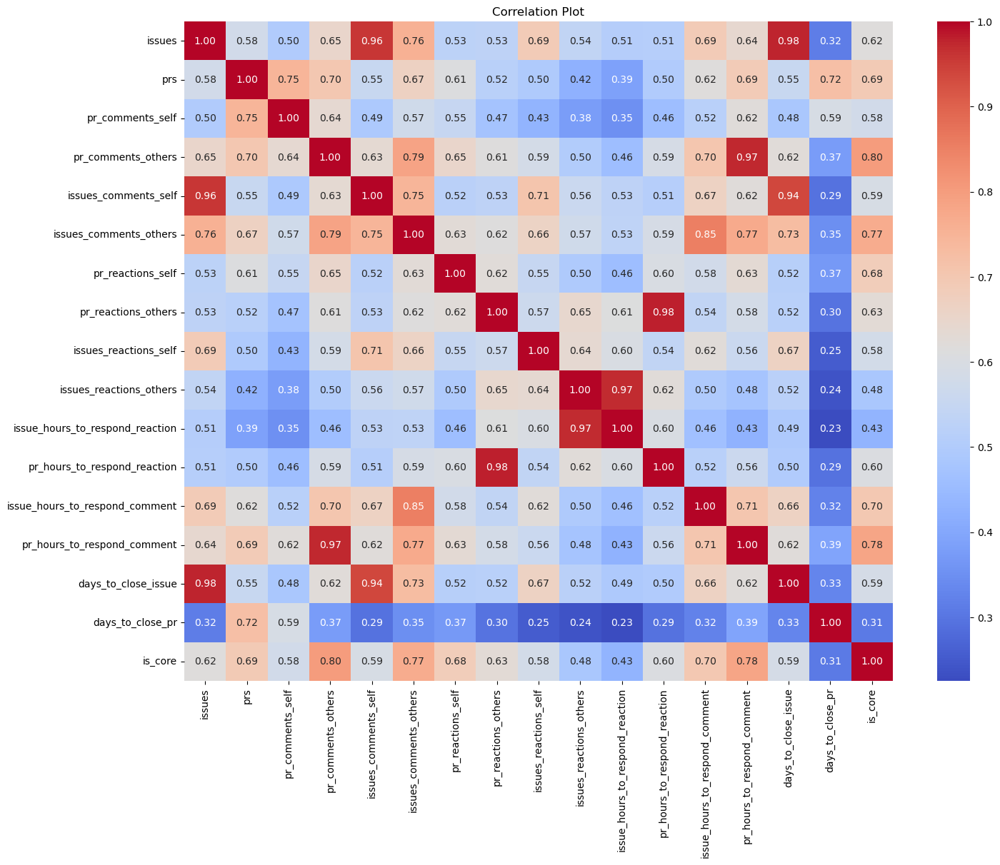

In [32]:
# Creating a correlation heatmap
plt.figure(figsize=(16, 12))
sns.heatmap(train.corr(), annot=True, cmap='coolwarm', fmt=".2f")

# Adding a title
plt.title('Correlation Plot')

# Displaying the plot
plt.show()

issues: 0.4755
prs: 0.6113
pr_comments_self: 0.5712
pr_comments_others: 0.5986
issues_comments_self: 0.4411
issues_comments_others: 0.5444
pr_reactions_self: 0.4274
pr_reactions_others: 0.3281
issues_reactions_self: 0.2871
issues_reactions_others: 0.2573
issue_hours_to_respond_reaction: 0.1504
pr_hours_to_respond_reaction: 0.2296
issue_hours_to_respond_comment: 0.3357
pr_hours_to_respond_comment: 0.3991
days_to_close_issue: 0.2183
days_to_close_pr: 0.1383


Text(0.5, 1.0, 'Mutual Information of Features')

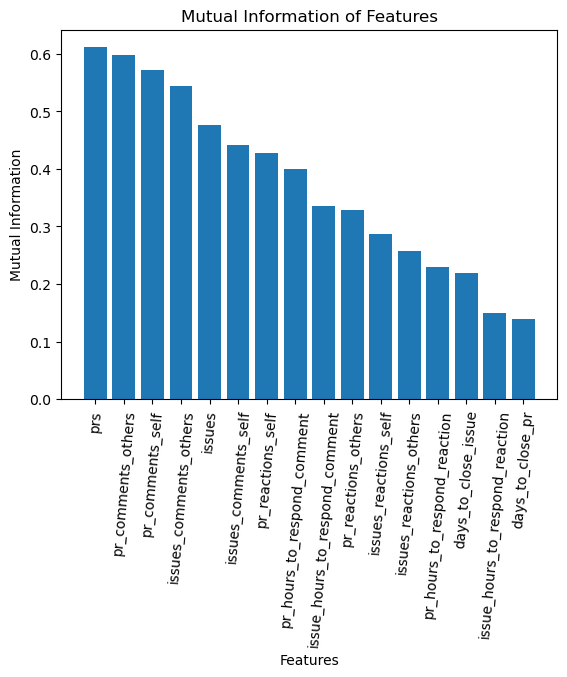

In [33]:
X = train.drop('is_core', axis=1)
y = train['is_core']

# Calculating mutual information for each feature
mi_scores = mutual_info_classif(X, y)  # For classification tasks


# Displaying the mutual information scores
for feature, score in zip(X.columns, mi_scores):
    print(f"{feature}: {score:.4f}")
    
sorted_data = [x for _, x in sorted(zip(mi_scores, X.columns), reverse=True)]
sorted_values = sorted(mi_scores, reverse=True)

plt.bar(sorted_data, sorted_values)
plt.xticks(rotation=85) 
plt.xlabel('Features')
plt.ylabel('Mutual Information')
plt.title('Mutual Information of Features')